In [1]:
import matplotlib
matplotlib.use('agg')

import xarray as xr
import pyart
pyart.config.get_field_colormap('CZ')
pycm = matplotlib.cm.get_cmap(pyart.config.get_field_colormap('CZ'))


import h5py
import numpy as np
import matplotlib.pyplot as plt

try:
    plt.style.use('presentation')
except Exception:
    pass


import sys
import os
sys.path.insert(0, os.path.abspath('/home/bdolan/python/'))

import glob
import numpy as np
import imp
import sys
#import bottleneck as bn
import oa_stats as OA 
import analysis_tools as AT

import Config

import pickle as pickle

import scipy.stats as stats
import scipy
import pandas
import dsd_helper_functions as dfunc
from matplotlib import colors
import matplotlib as mpl
import os
import argparse
import time
from matplotlib.colors import LogNorm

%load_ext autoreload
%autoreload 2

plt.rcParams.update({'font.size': 18})



#sys.setdefaultencoding('utf8')
%matplotlib inline


## You are using the Python ARM Radar Toolkit (Py-ART), an open source
## library for working with weather radar data. Py-ART is partly
## supported by the U.S. Department of Energy as part of the Atmospheric
## Radiation Measurement (ARM) Climate Research Facility, an Office of
## Science user facility.
##
## If you use this software to prepare a publication, please cite:
##
##     JJ Helmus and SM Collis, JORS 2016, doi: 10.5334/jors.119



/tmp/ipykernel_6574/2223388993.py:26: DeprecationWarning: the imp module is deprecated in favour of importlib; see the module's documentation for alternative uses
  import imp


In [2]:
from csu_radartools import csu_kdp

In [5]:

from CSU_RadarTools.csu_radartools import csu_dsd


#from csu_radartools import csu_kdp

from CSU_RadarTools.csu_radartools import csu_blended_rain

from CSU_RadarTools.csu_radartools import csu_fhc

from CSU_RadarTools.csu_radartools import csu_liquid_ice_mass



In [6]:
cfg = Config.Config('/precipitation/bdolan/BASELINE/simulation_settings_baseline_mass.yaml')
ycfg = cfg.v


In [7]:
exper = 'MC3E'
#exper = 'SUPER_BIN'
#exper = 'supercell_nu2'
rfile =ycfg['sims'][exper]['rain_file']
sim_cfg = ycfg['sims'][exper]
mu = 2
#mu = 'bin'

In [8]:
rdir = '/precipitation/smsaleeb/NOBAK/DOE.MICRO-simulations/h5a.mc3e.squall.clean.5min/'
dfile = 'mc3e-2011may20-clean-g3-diam.h5'
rfile = 'mc3e-2011may20-clean-g3-rain.h5'
#rfile = 'mc3e-2011may20-g3-CLE-rain.h5'
#rfile = 'supercell-grant-hires-hucm-full-300dx-g1-rain.h5'

In [9]:
data = xr.open_dataset(f'{rdir}{rfile}')#,engine='h5netcdf')#,phony_dims='sort')
diam = xr.open_dataset(f'{rdir}{dfile}')#,engine='h5netcdf')#,phony_dims='sort')

In [10]:
data.keys()

KeysView(<xarray.Dataset>
Dimensions:         (t_coords: 73, z_coords: 1, y_coords: 647, x_coords: 997)
Coordinates:
  * t_coords        (t_coords) datetime64[ns] 2011-05-20T03:00:00 ... 2011-05...
  * x_coords        (x_coords) float32 -102.1 -102.1 -102.1 ... -88.81 -88.8
  * y_coords        (y_coords) float32 33.02 33.03 33.04 ... 39.97 39.98 39.99
  * z_coords        (z_coords) float32 36.78
Data variables: (12/14)
    dn0             (t_coords, z_coords, y_coords, x_coords) float32 ...
    lat             (t_coords, y_coords, x_coords) float32 ...
    lon             (t_coords, y_coords, x_coords) float32 ...
    pcprr           (t_coords, y_coords, x_coords) float32 ...
    pi              (t_coords, z_coords, y_coords, x_coords) float32 ...
    pi0             (t_coords, z_coords, y_coords, x_coords) float32 ...
    ...              ...
    rain_concen_kg  (t_coords, z_coords, y_coords, x_coords) float32 ...
    rain_concen_m3  (t_coords, z_coords, y_coords, x_coords) float32 ..

In [11]:
fig_dir = '/precipitation/bdolan/JGR_FIGS/RV1/'

In [12]:
alldsd = pickle.load(open( "/precipitation/bdolan/ramsworld3_dsd_diam.p", "rb" ) )


In [13]:
#sim_cfg['hskip']=3

In [14]:
#hskip=sim_cfg['hskip']
hskip =3
#tskip = sim_cfg['tskip']
tskip= 1

In [15]:
rams_lons = data['x_coords'].values[::3]
rams_lats = data['y_coords'].values[::3]

In [16]:
tms = []
tt=0
muval =0.0
for t,r in enumerate(data['t_coords'][::tskip].values):
    tt=tt+tskip
    tms.append(tt)

print(mu)
if mu == 0.0:
    filtered_rain_dsd_dict = dfunc.format_subsample_dsd_data_diam(data,diam, nu=mu, tskip=tskip, hskip=hskip,d3=False)

else:
    filtered_rain_dsd_dict = dfunc.format_subsample_dsd_data_diam(data,diam, nu=mu,mu=muval, tskip=tskip, hskip=hskip,d3=False)


2
npshape d0d (73, 216, 333)
d3 is  False
rr shape (73, 216, 333)
(73, 216, 333)
0.0


In [17]:
filtered_rain_dsd_dict['shp']

(73, 216, 333)

In [18]:
filtered_rain_dsd_dict['rrr'].shape

(1294298,)

In [19]:
blank = np.zeros((filtered_rain_dsd_dict['shp'][0],filtered_rain_dsd_dict['shp'][1],filtered_rain_dsd_dict['shp'][2]))

In [20]:
ramr =np.ravel(np.zeros_like(blank))
ramr[filtered_rain_dsd_dict['whgd']]=filtered_rain_dsd_dict['rrr']
ramrr = np.reshape(ramr,filtered_rain_dsd_dict['shp'])

ramn =np.ravel(np.zeros_like(blank))
ramn[filtered_rain_dsd_dict['whgd']]=filtered_rain_dsd_dict['nww']
ramnw = np.reshape(ramn,filtered_rain_dsd_dict['shp'])

ramd =np.ravel(np.zeros_like(blank))
ramd[filtered_rain_dsd_dict['whgd']]=filtered_rain_dsd_dict['d00']
ramd0 = np.reshape(ramd,filtered_rain_dsd_dict['shp'])


In [21]:
np.shape(ramrr)

(73, 216, 333)

In [22]:
np.shape(ramd0)

(73, 216, 333)

In [23]:
blankr=np.ravel(blank)
blankb = blankr[filtered_rain_dsd_dict['whgd']]

In [24]:
np.shape(blankb)

(1294298,)

In [25]:
filtered_rain_dsd_dict['nww'].min()

-1.8669

In [26]:
alldsd.averages

{'nwd': 3.9881732,
 'dmd': 0.70766115,
 'sigm': 0.5483383,
 'llwc': -1.6802962,
 'lrr': -0.53433484,
 'lnt': 2.1683908}

In [27]:
import oa_stats as oa
good_vars = ['nwd', 'dmd', 'sigm', 'llwc', 'lrr', 'lnt']
labels = [ycfg['vars'][_]['label'] for _ in good_vars]
pc1sea, pc2sea = oa.get_eof_cast(filtered_rain_dsd_dict,alldsd,good_vars)



In [28]:
np.shape(pc1sea)

(1294298,)

In [29]:
rthresh=0.9
seagroups = dfunc.get_groups(pc1sea,pc2sea,rthresh,rthresh,rthresh,rthresh)
seagroupvals = dfunc.make_groups(pc1sea,seagroups)



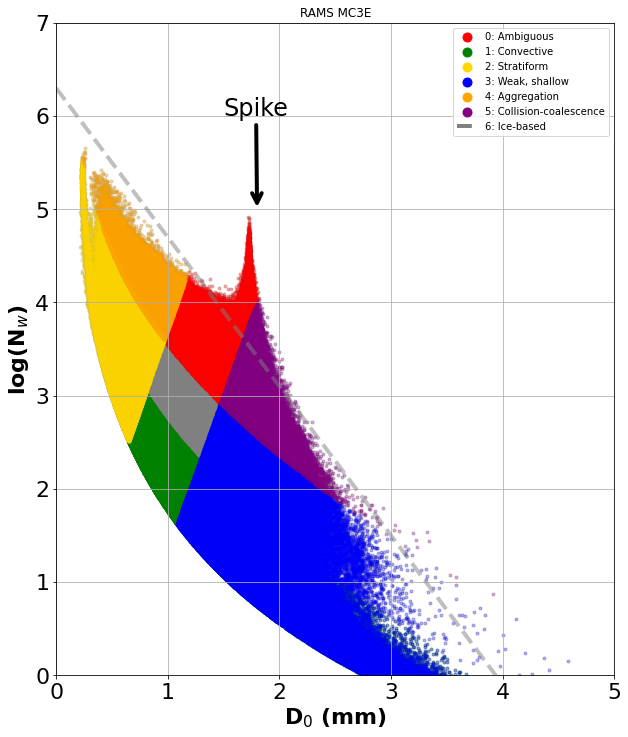

In [30]:
fig, ax = plt.subplots(1,1,figsize=(10,12))
ax = dfunc.plot_groups(filtered_rain_dsd_dict['d00'],(filtered_rain_dsd_dict['nww']),seagroups,ax,line_on=1)#f[0])
handles, labels = ax.get_legend_handles_labels()
labels = ['0: Ambiguous','1: Convective','2: Stratiform','3: Weak, shallow','4: Aggregation','5: Collision-coalescence','6: Ice-based']
l = ax.legend(handles[1:],labels,markerscale=3)


for lh in l.legendHandles: 
    lh.set_alpha(1)
    

ax.set_title(f"RAMS {exper}")
ax.set_xlim(0,5)
ax.set_ylim(0,7)
ax.set_xlabel('D$_0$ (mm)', fontsize=22,fontweight='bold')
ax.set_ylabel('log(N$_w$)',fontsize = 22,fontweight='bold')
ax.grid()
ax.annotate("Spike", xy=(1.8, 5.0), xytext=(1.5, 6.0),
             arrowprops=dict(arrowstyle="->",lw=4),fontsize=24)

ax.tick_params(axis='x', labelsize= 22)
ax.tick_params(axis='y',labelsize=22)
plt.savefig(f'{fig_dir}RAMS_{exper}NEW_D0-Nw_self_{rthresh}_newgrid.png',dpi=600,bbox_inches='tight')

In [31]:
#alldsd = dfunc.exper_eof(filtered_rain_dsd_dict, good_vars, labels)

In [32]:
eof1=alldsd.get_eof(rank=1)
eof2=alldsd.get_eof(rank=2)

In [33]:
#alldsd.flip_eof_and_pc(rank=2)

['black', 'purple', 'blue', 'green', 'gold', 'darkorange', 'red']


(<Figure size 720x576 with 6 Axes>,
 array([[<AxesSubplot:title={'center':'EOF 1'}>,
         <AxesSubplot:title={'center':'PC 1: 57.8% variance'}>],
        [<AxesSubplot:title={'center':'EOF 2'}>,
         <AxesSubplot:title={'center':'PC 2: 41.6% variance'}>],
        [<AxesSubplot:title={'center':'EOF 3'}>,
         <AxesSubplot:title={'center':'PC 3: 0.5% variance'}>]],
       dtype=object))

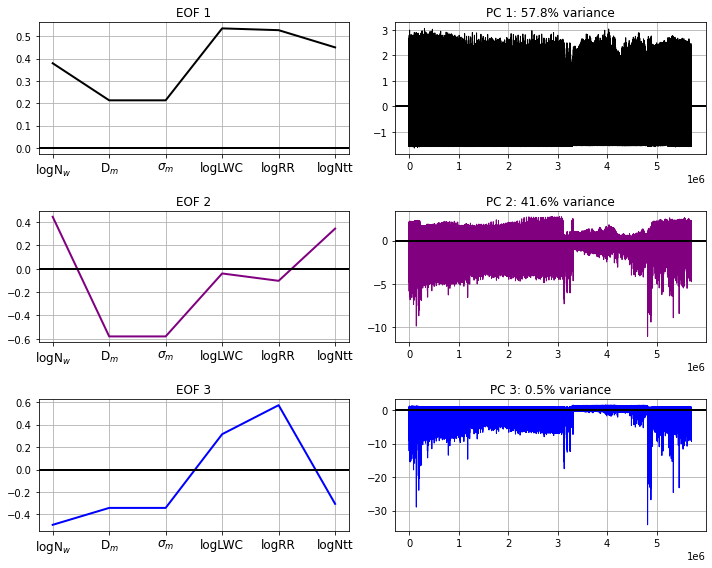

In [34]:
alldsd.plot_eofs(rank=[1,2])


In [35]:
pc1=np.zeros_like(blank)*np.nan
pc2 = np.zeros_like(blank)*np.nan


In [36]:
np.shape(np.ravel(pc1))

(5250744,)

In [37]:
pc1sub = alldsd.get_pc(rank=1)
pc2sub = alldsd.get_pc(rank=2)

In [38]:
pc1r =np.ravel(pc1)
pc1r[filtered_rain_dsd_dict['whgd']]=pc1sea
pc1 = np.reshape(pc1r,filtered_rain_dsd_dict['shp'])

In [39]:
pc2r =np.ravel(pc2)
pc2r[filtered_rain_dsd_dict['whgd']]=pc1sea
pc2 = np.reshape(pc2r,filtered_rain_dsd_dict['shp'])

/home/bdolan/python/dsd_helper_functions.py:1047: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  cb =ax.imshow(Hmasked.T/np.float(np.sum(Hmasked))*100., interpolation='nearest', origin='lower',


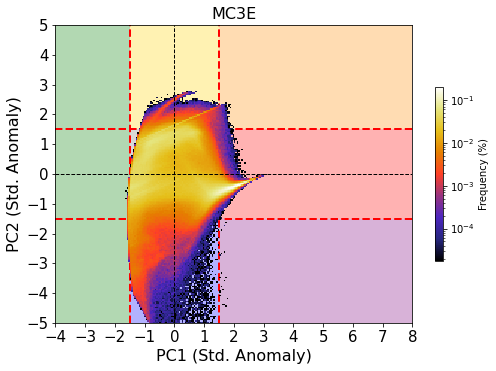

In [40]:
### Make a plot of PC1 vs. PC2 using the dsd helper functions
fig, ax = plt.subplots(1, 1, figsize=(8,8))
t = dfunc.get_2d_pchist(pc1sub,pc2sub,exper,ax)
plt.savefig(f'{exper}_PC1PC2.png',dpi=300,bbox_inches='tight')

In [41]:
rthresh=0.9
ramsgroups1 = dfunc.get_groups(pc1sea,pc2sea,rthresh,rthresh,rthresh,rthresh)
ramsvals1 = dfunc.make_groups(pc1sea,ramsgroups1)



In [42]:
# fig, ax = plt.subplots(1,1,figsize=(10,12))
# dfunc.plot_groups(ramd,ramn,ramsgroups1,ax)#f[0])
# ax.set_title('{e}'.format(e=f'RAMS BIN NEW {rthresh}'))
# ax.set_xlim(0,5)
# ax.set_ylim(0,7)
# ax.set_xlabel('D$_0$ (mm)')
# ax.set_ylabel('Log(N$_w$)')

#plt.savefig(f'RAMS_BINNEW_D0-Nw_self_{rthresh}.png',dpi=200)

In [43]:
ramvals2dr =np.ravel(np.zeros_like(blank))*np.nan
ramvals2dr[filtered_rain_dsd_dict['whgd']]=ramsvals1
ramvals2d = np.reshape(ramvals2dr,filtered_rain_dsd_dict['shp'])



[Text(1, 0.5, 'Amb'),
 Text(1, 1.5, 'Conv'),
 Text(1, 2.5, 'Strat'),
 Text(1, 3.5, 'Shallow'),
 Text(1, 4.5, 'Aggreg'),
 Text(1, 5.5, 'C-C'),
 Text(1, 6.5, 'Ice')]

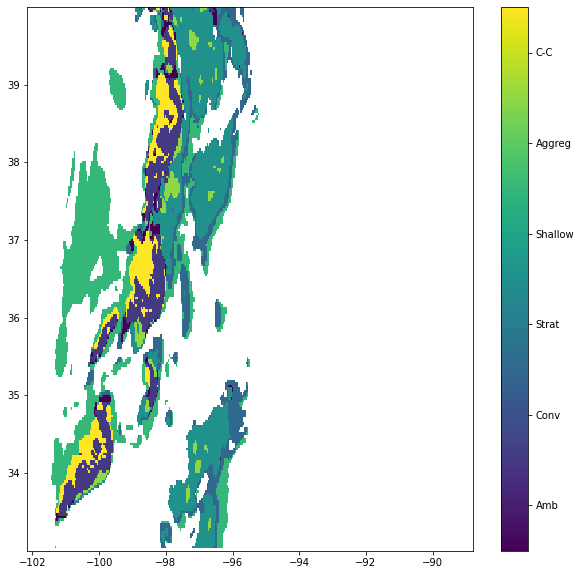

In [44]:
fig, ax = plt.subplots(1,1,figsize=(10,10))
ramtime=20
c = ax.pcolormesh(rams_lons,rams_lats,ramvals2d[ramtime,:,:])#,transform=ccrs.PlateCarree())
cb = plt.colorbar(c,ax=ax,orientation='vertical',ticks=[0.5,1.5,2.5,3.5,4.5,5.5,6.5])
#cb.ax.set_xticks([0.5,1.5,2.5,3.5,4.5,5.5,6.5])
cb.ax.set_yticklabels(['Amb','Conv', 'Strat', 'Shallow', 'Aggreg',
                           'C-C', 'Ice'])




In [45]:
cols=['gray','r','g','gold','blue','orange','purple']

In [46]:
pcacol = colors.ListedColormap(cols)

def adjust_fhc_colorbar_for_pyart(cb):
    cb.set_ticks(np.arange(0.4, 7.4, 1.0))
    cb.ax.set_yticklabels(['Amb','Group1', 'Group2', 'Group3', 'Group4',
                           'Group5', 'Group6'])
    cb.ax.set_ylabel('')
    cb.ax.tick_params(length=0)
    return cb



In [47]:
tms = []
tt=0
for t,r in enumerate(data['t_coords'][::tskip].values):
    tt=tt+tskip
    tms.append(tt)

In [48]:
np.shape(ramsvals1)
#rtest = np.reshape(ramsvals1,(73, 216, 333))

(1294298,)

In [49]:
movie_flag = 0

if movie_flag == 1:
    for i,tm in enumerate(tms):
        fig, ax = plt.subplots(1,1,figsize=(15,12))

        c = ax.pcolormesh(ramvals2d[i,:,:],vmin=0,vmax=7,cmap=pcacol)
        cb = plt.colorbar(c,ax=ax)
        adjust_fhc_colorbar_for_pyart(cb)
        plt.title(f"{exper} Surface PC tstep={tm:03d}")
        plt.tight_layout()
        plt.savefig(f'/claudian/bdolan/RAMS/PCMOVIES/{exper}_{tm:03d}_sfc.png',dpi=300,bbox_inches='tight')
        plt.close()

In [50]:
obsdata = pickle.load(open("/precipitation/bdolan/RAMS/pickles/world_dsd_NEW_nohiNOGO.p",'rb'),encoding='latin1')
opc1 = obsdata.get_pc(rank=1)
opc2 = obsdata.get_pc(rank=2)


oeof1 = obsdata.get_eof(rank=1)
oeof2 = obsdata.get_eof(rank=2)
oeof3 = obsdata.get_eof(rank=3)



In [51]:
obsraindata = pickle.load(open("/precipitation/bdolan/RAMS/pickles/worldraindata_NEW_nohi.p",'rb'),encoding='latin1')

In [52]:
obsraindata.keys()

dict_keys(['exper', 'nww', 'lnw', 'sigm', 'd00', 'lrr', 'llwc', 'lnt', 'rrr', 'lwcc', 'dbzss', 'zdrss', 'kdpss', 'muu', 'ntt', 'dmm', 'kdpratss', 'datetime'])

In [53]:
whm =np.squeeze(np.where(obsdata.data['exper'] == 'mc3e'))
print(np.shape(whm))
print(np.shape(opc1))
print(np.shape(obsdata.data['nww']))

(6043,)
(403769,)
(403769,)


In [54]:
orr = obsdata.data['rrr'][whm]
od0 = obsdata.data['d00'][whm]
onw = obsdata.data['nww'][whm]
odt = obsdata.data['datetime'][whm]
opc1m = opc1[whm]
opc2m = opc2[whm]
print(np.shape(orr))

(6043,)


In [55]:
o3groups = dfunc.get_groups(opc1m,opc2m,0.8,0.8,0.8,0.8)

In [56]:
disdrom_trace1_g = ramvals2d[:,100,100]

disdrom_trace1_rr=ramrr[:,100,100]
disdrom_trace1_d0=ramd0[:,100,100]
disdrom_trace1_nww=ramnw[:,100,100]

disdrom_trace2_g = ramvals2d[:,110,150]
disdrom_trace2_rr=ramrr[:,110,150]
disdrom_trace2_d0=ramd0[:,110,150]
disdrom_trace2_nww=ramnw[:,110,150]

disdrom_trace3_g = ramvals2d[:,175,100]
disdrom_trace3_rr=ramrr[:,175,100]
disdrom_trace3_d0=ramd0[:,175,100]
disdrom_trace3_nww=ramnw[:,175,100]

disdrom_trace4_g = ramvals2d[:,115,200]
disdrom_trace4_rr=ramrr[:,115,200]
disdrom_trace4_d0=ramd0[:,115,200]
disdrom_trace4_nww=ramnw[:,115,200]


disdrom_trace5_g = ramvals2d[:,130,150]
disdrom_trace5_rr=ramrr[:,130,150]
disdrom_trace5_d0=ramd0[:,130,150]
disdrom_trace5_nww=ramnw[:,130,150]




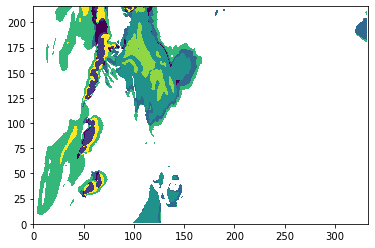

In [57]:
plt.pcolormesh(ramvals2d[0,:,:])

[Text(1, 0.5, 'Amb'),
 Text(1, 1.5, 'Conv'),
 Text(1, 2.5, 'Strat'),
 Text(1, 3.5, 'Shallow'),
 Text(1, 4.5, 'Aggreg'),
 Text(1, 5.5, 'C-C'),
 Text(1, 6.5, 'Ice')]

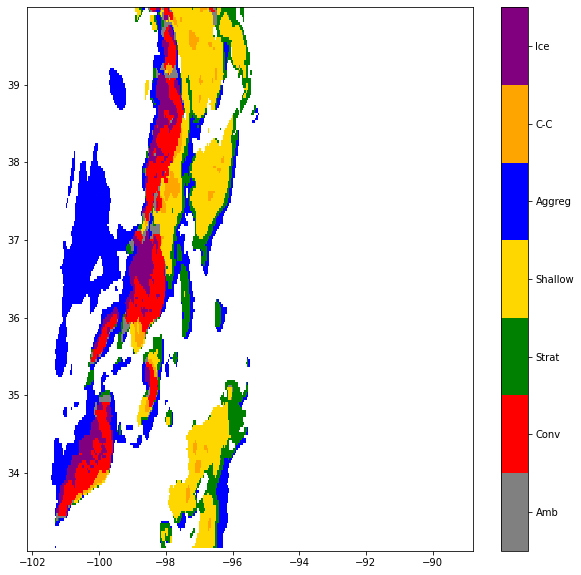

In [58]:
fig, ax = plt.subplots(1,1,figsize=(10,10))
ramtime=20

c = ax.pcolormesh(rams_lons,rams_lats,ramvals2d[ramtime,:,:],vmin=0,vmax=7,cmap=pcacol)#,transform=ccrs.PlateCarree())
cb = plt.colorbar(c,ax=ax,orientation='vertical',ticks=[0.5,1.5,2.5,3.5,4.5,5.5,6.5])
#cb.ax.set_xticks([0.5,1.5,2.5,3.5,4.5,5.5,6.5])
cb.ax.set_yticklabels(['Amb','Conv', 'Strat', 'Shallow', 'Aggreg',
                           'C-C', 'Ice'])



In [59]:
import datetime

In [60]:
stime = datetime.datetime(2011,5,20,6,)
etime = datetime.datetime(2011,5,20,18)

In [61]:
whm3 = np.where(np.logical_and(odt>stime,odt<etime))

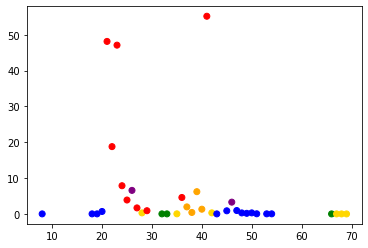

In [62]:
plt.scatter(tms,disdrom_trace1_rr,c=disdrom_trace1_g,vmin=0,vmax=7,cmap=pcacol)

In [63]:
og3 = np.zeros_like(opc1m)
og3[o3groups['Group1']] = 1
og3[o3groups['Group2']] = 2
og3[o3groups['Group3']] = 3
og3[o3groups['Group4']] = 4
og3[o3groups['Group5']] = 5
og3[o3groups['Group6']] = 6






In [64]:
datt = datetime.datetime(2011,5,20,3)
dattn=[]
for t in tms:
    dattn.append(datt+datetime.timedelta(minutes=10))
    datt = datt+datetime.timedelta(minutes=10)
dattn=np.array(dattn)

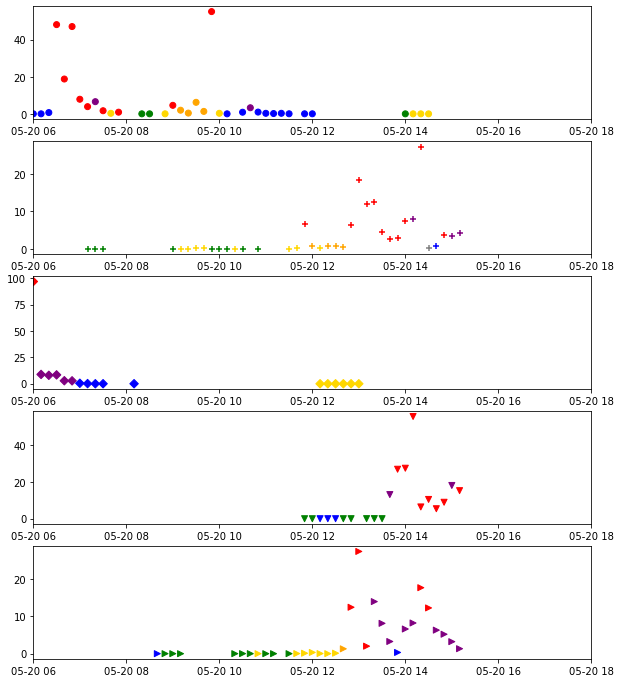

In [65]:
fig, ax = plt.subplots(5,1,figsize=(10,12))
axf=ax.flatten()
axf[0].scatter(dattn,disdrom_trace1_rr,c=disdrom_trace1_g,vmin=0,vmax=7,cmap=pcacol ,marker='o')
axf[1].scatter(dattn,disdrom_trace2_rr,c=disdrom_trace2_g,vmin=0,vmax=7,cmap=pcacol,marker='+')
axf[2].scatter(dattn,disdrom_trace3_rr,c=disdrom_trace3_g,vmin=0,vmax=7,cmap=pcacol,marker='D')
axf[3].scatter(dattn,disdrom_trace4_rr,c=disdrom_trace4_g,vmin=0,vmax=7,cmap=pcacol,marker='v')
axf[4].scatter(dattn,disdrom_trace5_rr,c=disdrom_trace5_g,vmin=0,vmax=7,cmap=pcacol,marker='>')

for a in axf:
    a.set_xlim(stime,etime)

(15114.25, 15114.75)

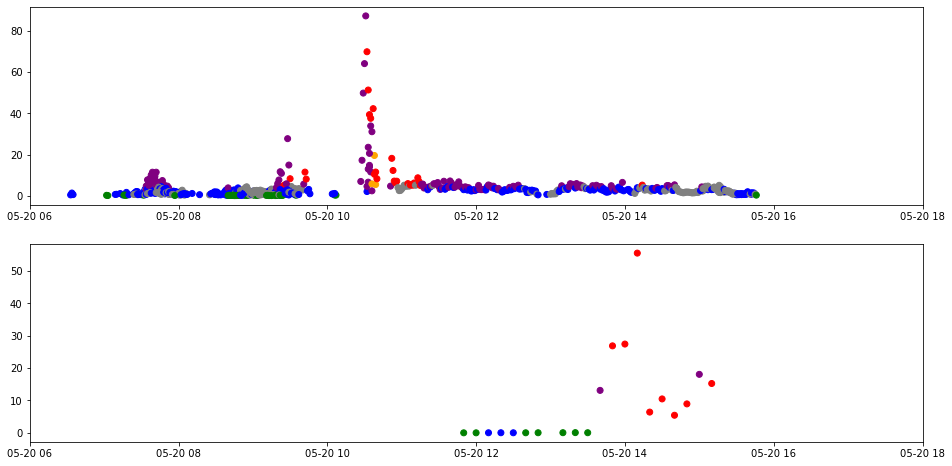

In [66]:
fig, ax = plt.subplots(2,1,figsize=(16,8))
axf = ax.flatten()
axf[0].scatter(odt[whm3],orr[whm3],c=og3[whm3],vmin=0,vmax=7,cmap=pcacol)
axf[0].set_xlim(stime,etime)


axf[1].scatter(dattn,disdrom_trace4_rr,c=disdrom_trace4_g,vmin=0,vmax=7,cmap=pcacol)
axf[1].set_xlim(stime,etime)



In [67]:
radar = pyart.io.read('/precipitation/bdolan/sgpcsaprsurcmacI7.c0.20110520.095101.nc')

In [68]:
radar.fields.keys()

dict_keys(['corrected_reflectivity_horizontal', 'reflectivity_horizontal', 'rain_rate_A', 'specific_attenuation', 'unf_dp_phase_shift', 'mean_doppler_velocity', 'diff_phase', 'dp_phase_shift', 'recalculated_diff_phase', 'norm_coherent_power', 'corrected_mean_doppler_velocity', 'doppler_spectral_width', 'diff_reflectivity', 'proc_dp_phase_shift', 'copol_coeff'])

In [69]:
from csuram import RadarConfig
import cartopy.crs as ccrs

In [70]:
projection = ccrs.LambertConformal(central_latitude=radar.latitude['data'][0],
                                   central_longitude=radar.longitude['data'][0])


In [71]:
configdat = RadarConfig.RadarConfig(dz='CZ')

In [72]:
# for d in dattn:
#     print(d)

In [73]:
sn25 = [36.6233,-97.53222]
sn35 = [36.618,-97.4797]
sn36 = [36.58138,-97.4786]
sn37 = [36.633,-97.48083]
sn38 = [36.57833,-97.444]

In [74]:
print(np.shape(rams_lons))
whtp_lon=np.where(np.isclose(sn25[1],rams_lons,rtol=0.0005))[0][0]
whtp_lat=np.where(np.isclose(sn25[0],rams_lats,rtol=0.0005))[0][0]
#print(whpt_lon,whpt_lat)

whtp_lon35=np.where(np.isclose(sn35[1],rams_lons,rtol=0.0005))[0][0]
whtp_lat35=np.where(np.isclose(sn35[0],rams_lats,rtol=0.0005))[0][0]


#rams_sn25 = [whpt_lon,whpt_lat]

(333,)


In [75]:
sn25_trace1_g = np.squeeze(ramvals2d[:,whtp_lat,whtp_lon])
sn25_trace1_rr=np.squeeze(ramrr[:,whtp_lat,whtp_lon])
sn25_trace1_d0=np.squeeze(ramd0[:,whtp_lat,whtp_lon])
sn25_trace1_nww=np.squeeze(ramnw[:,whtp_lat,whtp_lon])

sn35_trace1_g = np.squeeze(ramvals2d[:,whtp_lat35,whtp_lon35])
sn35_trace1_rr=np.squeeze(ramrr[:,whtp_lat35,whtp_lon35])
sn35_trace1_d0=np.squeeze(ramd0[:,whtp_lat35,whtp_lon35])
sn35_trace1_nww=np.squeeze(ramnw[:,whtp_lat35,whtp_lon35])




In [76]:
#whtp_lat35

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


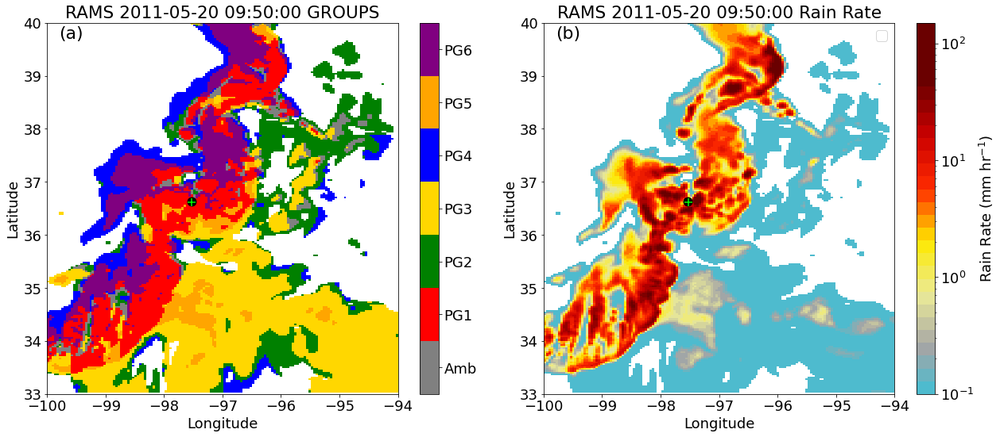

In [77]:
#fig, ax = plt.subplots(1,2,figsize=(15,8),projection=projection)
#fig = plt.figure(figsize=(16, 10))
plt.rcParams.update({'font.size': 18})


fig, ax =plt.subplots(1,2,figsize=(18,8))
axf=ax.flatten()
ax1=axf[0]
ax1 = plt.subplot(1, 2, 1)#, projection=ccrs.PlateCarree())
#axf=ax.flatten()
ramtime = 40
c = ax1.pcolormesh(rams_lons,rams_lats,ramvals2d[ramtime,:,:],vmin=0,vmax=7,cmap=pcacol)#,transform=ccrs.PlateCarree())
cb = plt.colorbar(c,ax=ax1,orientation='vertical',ticks=[0.5,1.5,2.5,3.5,4.5,5.5,6.5])
#cb.ax.set_xticks([0.5,1.5,2.5,3.5,4.5,5.5,6.5])
cb.ax.set_yticklabels(['Amb','PG1', 'PG2', 'PG3', 'PG4',
                           'PG5', 'PG6'])
# axf[0].scatter(150,110,color='k',marker='+',label='d2')
# axf[0].scatter(100,100,color='k',marker='o',label='d1')
# axf[0].scatter(100,175,color='k',marker='D',label='d3')
# axf[0].scatter(200,115,color='k',marker='v',label='d4')
# axf[0].scatter(150,130,color='k',marker='>',label='d5')
ax1.scatter(sn25[1],sn25[0],color='k',marker='o',s=120)

ax1.scatter(rams_lons[whtp_lon35],rams_lats[whtp_lat35],color='lime',marker='+',s=120)

# ax1.scatter(sn35[1],sn35[0],color='k',marker='+')
# ax1.scatter(sn36[1],sn36[0],color='k',marker='D')
# ax1.scatter(sn37[1],sn37[0],color='k',marker='>')
# ax1.scatter(sn38[1],sn38[0],color='k',marker='o')
ax1.set_xlim(-100,-94)
ax1.set_ylim(33,40)
ax1.set_xlabel('Longitude')
ax1.set_ylabel('Latitude')

ax1.set_title(f"RAMS {dattn[ramtime]} GROUPS")

#ax2 = plt.subplot(1, 2, 2)#, projection=ccrs.PlateCarree())
ax2=axf[1]

c = ax2.pcolormesh(rams_lons,rams_lats,ramrr[ramtime,:,:],norm=colors.LogNorm(0.1,150),cmap = configdat.kdp_cmap)#,vmin=0,vmax=7,cmap=pcacol)
cb = plt.colorbar(c,ax =ax2,orientation='vertical')
cb.set_label("Rain Rate (mm hr$^{-1}$)")
ax2.scatter(sn25[1],sn25[0],color='k',marker='o',s=120)

ax2.scatter(rams_lons[whtp_lon35],rams_lats[whtp_lat35],color='lime',marker='+',s=120)


# ax2.scatter(sn35[1],sn35[0],color='k',marker='+')
# ax2.scatter(sn36[1],sn36[0],color='k',marker='D')
# ax2.scatter(sn37[1],sn37[0],color='k',marker='>')
# ax2.scatter(sn38[1],sn38[0],color='k',marker='o')
ax2.set_xlim(-100,-94)
ax2.set_ylim(33,40)
ax2.set_xlabel('Longitude')
ax2.set_ylabel('Latitude')



ax2.set_title(f"RAMS {dattn[ramtime]} Rain Rate")



ax2.legend()
plt.tight_layout()


ax2.text(-99.8,39.7,'(b)',fontsize=22)
ax1.text(-99.8,39.7,'(a)',fontsize=22)


plt.savefig(f"{fig_dir}RAMS_MC3E_Groups-RR_20110520_0950.png",dpi=300,bbox_inches='tight')

In [78]:
# fig = plt.figure(figsize=(18,8),projection=ccrs.PlateCarree())
# ax1 = fig.add_subplot(111)

# import cartopy.crs as ccrs
# projection = ccrs.LambertConformal(central_latitude=radar.latitude['data'][0],
#                                   central_longitude=radar.longitude['data'][0])


# display= pyart.graph.RadarMapDisplay(radar)
# display.plot_ppi_map('corrected_reflectivity_horizontal',sweep = 1,
#                      cmap=configdat.temp_cmap,vmin=0,vmax=80,resolution='10m',
#                      projection=projection,
#                      fig=fig, lat_0=radar.latitude['data'][0],
#                      lon_0=radar.longitude['data'][0])

# ax1.scatter(sn25[1],sn25[0],color='k',marker='o',transform=ccrs.PlateCarree())

# ax1.scatter(rams_lons[whtp_lon35],rams_lats[whtp_lat35],color='lime',marker='+',transform=ccrs.PlateCarree())

# ax1.text(-115,105,'(a)',fontsize=22)


# # display.plot_point(sn25[1],sn25[0],color='k',marker='d')
# # display.plot_point(sn35[1],sn35[0],color='k')
# # display.plot_point(sn36[1],sn36[0],color='k')
# # display.plot_point(sn37[1],sn37[0],color='k')
# # display.plot_point(sn38[1],sn38[0],color='k')


In [79]:
radar.fields.keys()

dict_keys(['corrected_reflectivity_horizontal', 'reflectivity_horizontal', 'rain_rate_A', 'specific_attenuation', 'unf_dp_phase_shift', 'mean_doppler_velocity', 'diff_phase', 'dp_phase_shift', 'recalculated_diff_phase', 'norm_coherent_power', 'corrected_mean_doppler_velocity', 'doppler_spectral_width', 'diff_reflectivity', 'proc_dp_phase_shift', 'copol_coeff'])

/home/bdolan/miniconda3/lib/python3.9/site-packages/cartopy/mpl/geoaxes.py:1606: MatplotlibDeprecationWarning: This usage of Quadmesh is deprecated: Parameters meshWidth and meshHeights will be removed; coordinates must be 2D; all parameters except coordinates will be keyword-only.
  collection = mcoll.QuadMesh(
/home/bdolan/miniconda3/lib/python3.9/site-packages/cartopy/mpl/geoaxes.py:1606: MatplotlibDeprecationWarning: This usage of Quadmesh is deprecated: Parameters meshWidth and meshHeights will be removed; coordinates must be 2D; all parameters except coordinates will be keyword-only.
  collection = mcoll.QuadMesh(


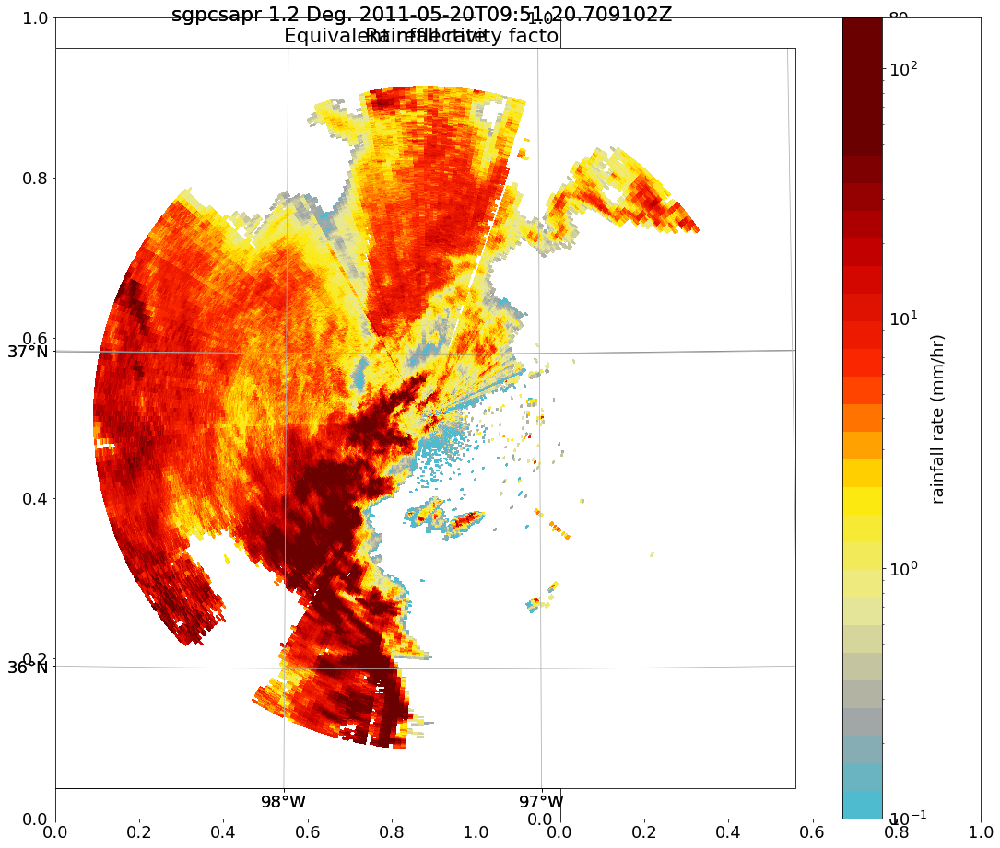

In [80]:
fig = plt.figure(figsize=(18,16))

ax1 = fig.add_subplot(121)

display= pyart.graph.RadarMapDisplay(radar,grid_projection=projection)
display.plot_ppi_map('corrected_reflectivity_horizontal',sweep = 1,fig=fig,
                     cmap=configdat.temp_cmap,vmin=0,vmax=80,ax =ax1,projection=projection)#,
                     #resolution='10m',ax=ax1,
                     #,
                     #fig=fig, lat_0=radar.latitude['data'][0],
                     #lon_0=radar.longitude['data'][0])

#display.plot_point(sn25[1],sn25[0],color='violet',marker='d',ms=18)


ax2 = fig.add_subplot(122)

display= pyart.graph.RadarMapDisplay(radar,grid_projection=projection)#,grid_projection=projection)
display.plot_ppi_map('rain_rate_A',sweep = 1,
                      norm=colors.LogNorm(0.1,160),cmap = configdat.kdp_cmap,ax =ax2,projection=projection)
#                      resolution='10m',ax=ax2,
#                      projection=projection,
#                      fig=fig, lat_0=radar.latitude['data'][0],
#                      lon_0=radar.longitude['data'][0])





/home/bdolan/miniconda3/lib/python3.9/site-packages/cartopy/crs.py:2320: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  a = np.float(self.globe.semimajor_axis or WGS84_SEMIMAJOR_AXIS)
/home/bdolan/miniconda3/lib/python3.9/site-packages/cartopy/crs.py:2321: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  b = np.float(self.globe.semiminor_axis

<Figure size 432x432 with 0 Axes>

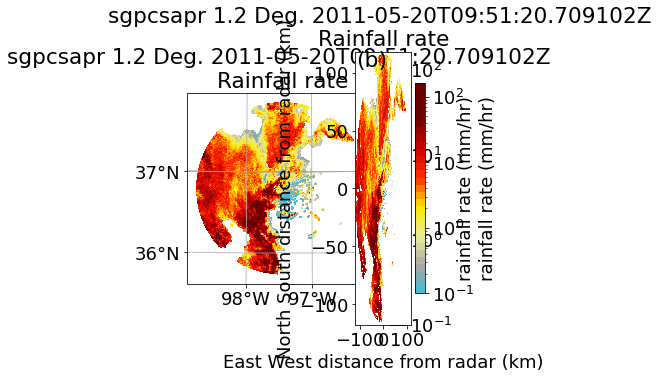

In [81]:
import cartopy.crs as ccrs

fig = plt.figure(figsize=(18,8))
ax1 = fig.add_subplot(121)
# Setting projection and ploting the second tilt
projection = ccrs.PlateCarree()

fig = plt.figure(figsize=(6, 6))

display = pyart.graph.RadarMapDisplay(radar)

# Setting projection and ploting the second tilt
projection = ccrs.LambertConformal(
    central_latitude=radar.latitude["data"][0],
    central_longitude=radar.longitude["data"][0],
)

fig = plt.figure(figsize=(6, 6))
display= pyart.graph.RadarMapDisplay(radar,grid_projection=projection)
display.plot_ppi_map('rain_rate_A',sweep = 1,
                     norm=colors.LogNorm(0.1,160),cmap = configdat.kdp_cmap,
                     resolution='10m',
                     projection=projection,
                     fig=fig, lat_0=radar.latitude['data'][0],
                     lon_0=radar.longitude['data'][0])


ax2 = fig.add_subplot(122)
# #display= pyart.graph.RadarMapDisplay(radar)
display= pyart.graph.RadarDisplay(radar)

display.plot_ppi('rain_rate_A',sweep = 1,
                     norm=colors.LogNorm(0.1,160),cmap = configdat.kdp_cmap)#,projection=projection)
# display.plot_point(sn25[1],sn25[0],color='k',marker='d')
# display.plot_point(sn35[1],sn35[0],color='k')
# display.plot_point(sn36[1],sn36[0],color='k')
# display.plot_point(sn37[1],sn37[0],color='k')
# display.plot_point(sn38[1],sn38[0],color='k')


plt.tight_layout()
plt.rcParams.update({'font.size': 18})


ax2.text(-115,105,'(b)',fontsize=22)
ax1.text(-115,105,'(a)',fontsize=22)


plt.savefig(f"{fig_dir}CSAPR_20110520_0951_DBZ_RR.png",dpi=300,bbox_inches='tight')

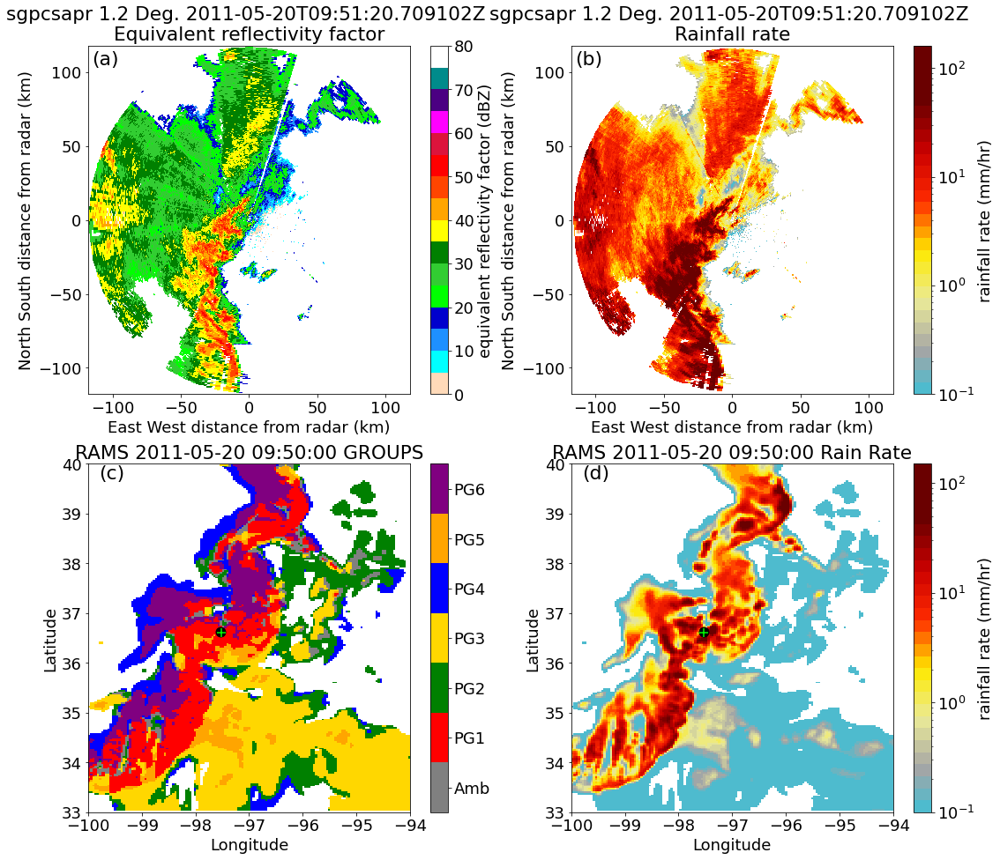

In [82]:
fig = plt.figure(figsize=(18,16))

ax3 = fig.add_subplot(221)


display= pyart.graph.RadarDisplay(radar)

display.plot_ppi('corrected_reflectivity_horizontal',sweep = 1,
                     cmap=configdat.temp_cmap,vmin=0,vmax=80)#,projection=projection)
#display.plot_point(sn25[1],sn25[0],color='lime',marker='d')
# display.plot_point(sn35[1],sn35[0],color='k')
# display.plot_point(sn36[1],sn36[0],color='k')
# display.plot_point(sn37[1],sn37[0],color='k')
# display.plot_point(sn38[1],sn38[0],color='k')
#ax2.scatter(sn25[1],sn25[0],color='k',marker='o',s=120)

ax4 = fig.add_subplot(222)
# #display= pyart.graph.RadarMapDisplay(radar)
display= pyart.graph.RadarDisplay(radar)

display.plot_ppi('rain_rate_A',sweep = 1,
                     norm=colors.LogNorm(0.1,160),cmap = configdat.kdp_cmap)#,projection=projection)
#display.plot_point(sn25[1],sn25[0],color='lime',marker='d')
# display.plot_point(sn35[1],sn35[0],color='k')
# display.plot_point(sn36[1],sn36[0],color='k')
# display.plot_point(sn37[1],sn37[0],color='k')
# display.plot_point(sn38[1],sn38[0],color='k')
ax3.text(-115,105,'(a)',fontsize=22)
ax4.text(-115,105,'(b)',fontsize=22)


ax1 = fig.add_subplot(223)
#ax1 = plt.subplot(1, 2, 1)#, projection=ccrs.PlateCarree())
#axf=ax.flatten()
ramtime = 40
c = ax1.pcolormesh(rams_lons,rams_lats,ramvals2d[ramtime,:,:],vmin=0,vmax=7,cmap=pcacol)#,transform=ccrs.PlateCarree())
cb = plt.colorbar(c,ax=ax1,orientation='vertical',ticks=[0.5,1.5,2.5,3.5,4.5,5.5,6.5])
#cb.ax.set_xticks([0.5,1.5,2.5,3.5,4.5,5.5,6.5])
cb.ax.set_yticklabels(['Amb','PG1', 'PG2', 'PG3', 'PG4',
                           'PG5', 'PG6'])
# axf[0].scatter(150,110,color='k',marker='+',label='d2')
# axf[0].scatter(100,100,color='k',marker='o',label='d1')
# axf[0].scatter(100,175,color='k',marker='D',label='d3')
# axf[0].scatter(200,115,color='k',marker='v',label='d4')
# axf[0].scatter(150,130,color='k',marker='>',label='d5')
ax1.scatter(sn25[1],sn25[0],color='k',marker='o',s=120)

ax1.scatter(rams_lons[whtp_lon35],rams_lats[whtp_lat35],color='lime',marker='+',s=120)

# ax1.scatter(sn35[1],sn35[0],color='k',marker='+')
# ax1.scatter(sn36[1],sn36[0],color='k',marker='D')
# ax1.scatter(sn37[1],sn37[0],color='k',marker='>')
# ax1.scatter(sn38[1],sn38[0],color='k',marker='o')
ax1.set_xlim(-100,-94)
ax1.set_ylim(33,40)
ax1.set_xlabel('Longitude')
ax1.set_ylabel('Latitude')

ax1.set_title(f"RAMS {dattn[ramtime]} GROUPS")

#ax2 = plt.subplot(1, 2, 2)#, projection=ccrs.PlateCarree())
ax2=fig.add_subplot(224)

c = ax2.pcolormesh(rams_lons,rams_lats,ramrr[ramtime,:,:],norm=colors.LogNorm(0.1,150),cmap = configdat.kdp_cmap)#,vmin=0,vmax=7,cmap=pcacol)
cb = plt.colorbar(c,ax =ax2,orientation='vertical')
cb.set_label("rainfall rate (mm/hr)")
ax2.scatter(sn25[1],sn25[0],color='k',marker='o',s=120)

ax2.scatter(rams_lons[whtp_lon35],rams_lats[whtp_lat35],color='lime',marker='+',s=120)


# ax2.scatter(sn35[1],sn35[0],color='k',marker='+')
# ax2.scatter(sn36[1],sn36[0],color='k',marker='D')
# ax2.scatter(sn37[1],sn37[0],color='k',marker='>')
# ax2.scatter(sn38[1],sn38[0],color='k',marker='o')
ax2.set_xlim(-100,-94)
ax2.set_ylim(33,40)
ax2.set_xlabel('Longitude')
ax2.set_ylabel('Latitude')



ax2.set_title(f"RAMS {dattn[ramtime]} Rain Rate")




ax2.text(-99.8,39.7,'(d)',fontsize=22)
ax1.text(-99.8,39.7,'(c)',fontsize=22)


plt.savefig(f"{fig_dir}CSAPR-RAMS_20110520_0950UTC_DBZ_RR.png",dpi=300,bbox_inches='tight')

In [83]:
plt.tight_layout()
radars = pyart.io.read('/precipitation/bdolan/KVNX20110520_092052_V06')

<Figure size 432x288 with 0 Axes>

In [84]:
fig_dir

'/precipitation/bdolan/JGR_FIGS/RV1/'

In [85]:
print(radars.fields.keys())
radsubs = radars.extract_sweeps([0])




dict_keys(['velocity', 'differential_reflectivity', 'reflectivity', 'differential_phase', 'spectrum_width', 'cross_correlation_ratio'])


In [86]:

dzs = radsubs.fields['reflectivity']['data']
zdrs = radsubs.fields['differential_reflectivity']['data']
phs = radsubs.fields['differential_phase']['data']
rhs = radsubs.fields['cross_correlation_ratio']['data']
zs=radsubs.get_gate_x_y_z(0)[2]
rng2d, az2d = np.meshgrid(radars.range['data'], radars.azimuth['data'])

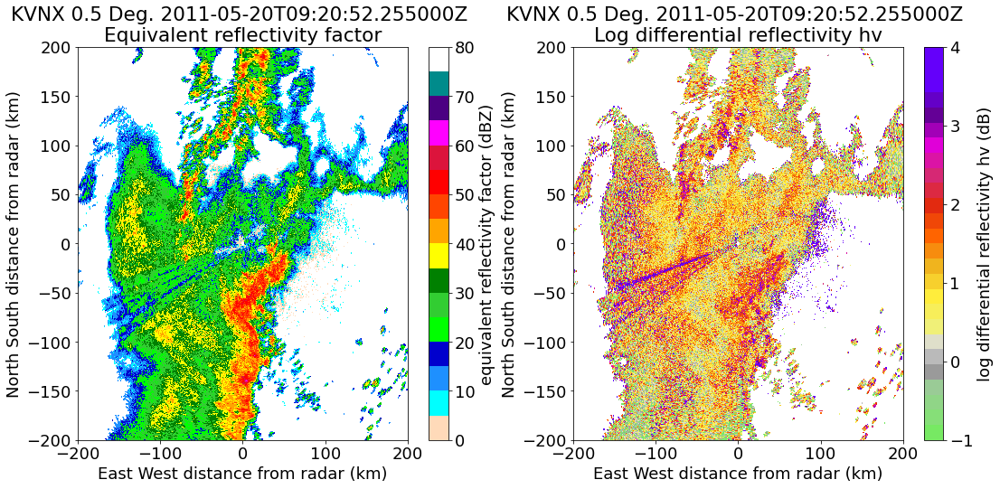

In [87]:
fig = plt.figure(figsize=(18,8))
ax1 = fig.add_subplot(121)

display = pyart.graph.RadarDisplay(radars)
display.plot('reflectivity',vmin=0,vmax=80,cmap=configdat.temp_cmap)
display.set_limits([-200,200],[-200,200])
ax2 = fig.add_subplot(122)

display.plot('differential_reflectivity',vmin=-1,vmax=4,cmap=configdat.zdr_cmap)
display.set_limits([-200,200],[-200,200])




In [88]:
kdN, fdN, sdN = csu_kdp.calc_kdp_bringi(
    dp=phs, dz=dzs, rng=rng2d/1000.0, thsd=12, gs=250.0, window=5)


In [89]:
d0s, nws, mus = csu_dsd.calc_dsd_sband_bringi_2004(dzs,zdrs,kdN)



/home/bdolan/python/CSU_RadarTools/csu_radartools/csu_dsd.py:153: RuntimeWarning: invalid value encountered in power
  return a * (dz**b) * (kdp**c) * (zeta**d)


In [90]:
mls,mis = csu_liquid_ice_mass.calc_liquid_ice_mass(dzs,zdrs,zs)

In [91]:
radar_T= np.zeros_like(d0s)*20.

In [92]:

scores = csu_fhc.csu_fhc_summer(dz=dzs, zdr=zdrs, rho=rhs, kdp=kdN, use_temp=True, band='S',
                                T=radar_T)
fh = np.argmax(scores, axis=0) + 1

rains, methods = csu_blended_rain.csu_hidro_rain(
    dz=dzs, zdr=zdrs, kdp=kdN, fhc=fh, band='S')


/home/bdolan/python/CSU_RadarTools/csu_radartools/common.py:70: RuntimeWarning: invalid value encountered in power
  return a * kdp**b
/home/bdolan/python/CSU_RadarTools/csu_radartools/common.py:53: RuntimeWarning: invalid value encountered in power
  return a * kdp**b * 10.0**(c * zdr)


In [93]:
whgd1=np.logical_and(np.log10(nws)>0.0,np.log10(nws)<7)
whgd = np.where(np.logical_and(whgd1,d0s<6))


/tmp/ipykernel_6574/2642247727.py:1: RuntimeWarning: divide by zero encountered in log10
  whgd1=np.logical_and(np.log10(nws)>0.0,np.log10(nws)<7)


In [94]:
#VARS WE NEED. Nw, D0, mu, lwc, rr, nt. DOn't think we cna get NT, but let's see what happends with the other 5.
good_vars = ['lnw', 'd00', 'muu','llwc','lrr']#, 'dmaxx']#, 'sigdd']
labels = ['logN$_w$', 'D$_0$','$\mu$', 'logLWC', 'logRR']#'D$_{max}$',]#, '$\sigma$']

def make_lognorm(var):
    return np.log10(var)

raindatas ={}
raindatas['lnw'] =  make_lognorm(np.ravel(nws[whgd]))
raindatas['d00'] = np.ravel(d0s[whgd])
raindatas['muu'] = np.ravel(mus[whgd])
raindatas['llwc'] = make_lognorm(np.ravel(mls[whgd]))
raindatas['lrr'] = make_lognorm(np.ravel(rains[whgd]))

#print(np.min(raindata['lnw']),np.min(raindata['lrr']))
dsds = OA.Dataset(data = raindatas, data_type = 'attributes', method = 'svd')
dsds.into_matrix(varlist = good_vars)
C = dsds.covariance_matrix()
dsds.calculate_eofs()
dsds.set_eof_labels(labels)
dsds.auto_flip()

dsds.flip_eof_and_pc(rank=2)



<>:3: DeprecationWarning: invalid escape sequence \m
<>:3: DeprecationWarning: invalid escape sequence \m
/tmp/ipykernel_6574/4276245229.py:3: DeprecationWarning: invalid escape sequence \m
  labels = ['logN$_w$', 'D$_0$','$\mu$', 'logLWC', 'logRR']#'D$_{max}$',]#, '$\sigma$']
/tmp/ipykernel_6574/4276245229.py:6: RuntimeWarning: divide by zero encountered in log10
  return np.log10(var)


()
()
()
()
()


['black', 'purple', 'blue', 'green', 'gold', 'darkorange', 'red']


(<Figure size 720x576 with 6 Axes>,
 array([[<AxesSubplot:title={'center':'EOF 1'}>,
         <AxesSubplot:title={'center':'PC 1: 71.6% variance'}>],
        [<AxesSubplot:title={'center':'EOF 2'}>,
         <AxesSubplot:title={'center':'PC 2: 14.9% variance'}>],
        [<AxesSubplot:title={'center':'EOF 3'}>,
         <AxesSubplot:title={'center':'PC 3: 7.7% variance'}>]],
       dtype=object))

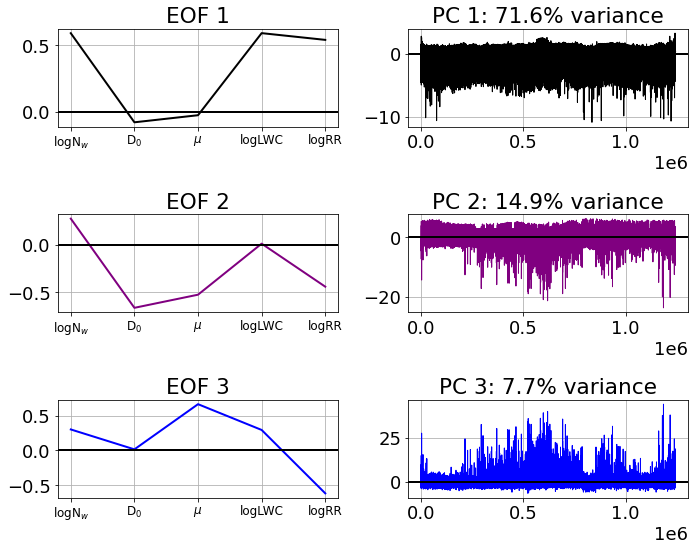

In [95]:
dsds.plot_eofs()

In [96]:
kvnxgroups = dfunc.get_groups(dsds.get_pc(rank=1),dsds.get_pc(rank=2),0.8,0.8,0.8,0.8)

/tmp/ipykernel_6574/2060686280.py:1: RuntimeWarning: divide by zero encountered in log10
  plt.scatter(d0s[whgd],np.log10(nws[whgd]))


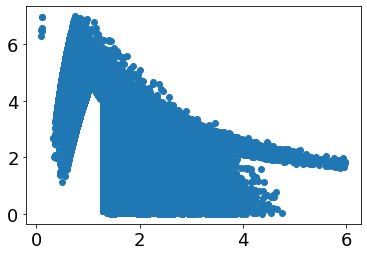

In [97]:
plt.scatter(d0s[whgd],np.log10(nws[whgd]))

In [98]:
gnumk = np.zeros_like(np.ravel(d0s[whgd]))
wh1 = kvnxgroups['Group1']
wh2 = kvnxgroups['Group2']
wh3 = kvnxgroups['Group3']
wh4 = kvnxgroups['Group4']
wh5 = kvnxgroups['Group5']
wh6 = kvnxgroups['Group6']


if np.any(wh1)>0:
    gnumk[wh1]=1
if np.any(wh2)>0:
    gnumk[wh2]=2
if np.any(wh3)>0:
    gnumk[wh3]=3
if np.any(wh4)>0:
    gnumk[wh4]=4
if np.any(wh5)>0:
    gnumk[wh5]=5
if np.any(wh6)>0:
    gnumk[wh6]=6








/tmp/ipykernel_6574/1357282107.py:2: RuntimeWarning: divide by zero encountered in log10
  plt.scatter(np.ravel(d0s[whgd]),np.log10(np.ravel(nws[whgd])),c=gnumk,vmin=0,vmax=7,cmap=pcacol ,marker='o')


(0.0, 7.0)

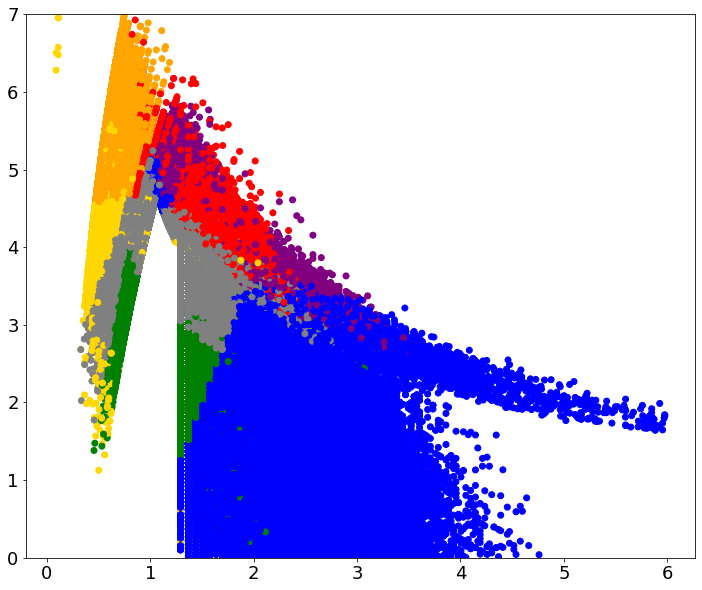

In [99]:
fig, ax =plt.subplots(1,1,figsize=(12,10))
plt.scatter(np.ravel(d0s[whgd]),np.log10(np.ravel(nws[whgd])),c=gnumk,vmin=0,vmax=7,cmap=pcacol ,marker='o')
plt.ylim(0,7)

In [100]:
#Now do CSAPR

In [101]:
radsub = radar.extract_sweeps([1])

In [102]:
dz = radsub.fields['corrected_reflectivity_horizontal']['data']
zdr = radsub.fields['diff_reflectivity']['data']
kdp = radsub.fields['recalculated_diff_phase']['data']
d0, nw, mu = csu_dsd.calc_dsd_sband_bringi_2004(dz,zdr,kdp)

In [103]:
z=radsub.get_gate_x_y_z(0)[2]

In [104]:
rr = radsub.fields['rain_rate_A']['data']

In [105]:
ml,mi = csu_liquid_ice_mass.calc_liquid_ice_mass(dz,zdr,z)

In [106]:
import analysis_tools as AT
import oa_stats as OA

In [107]:
print(np.shape(nw))
print(np.shape(d0))
print(np.shape(mu))
print(np.shape(ml))
print(np.shape(rr))

(360, 983)
(360, 983)
(360, 983)
(360, 983)
(360, 983)


In [108]:
#VARS WE NEED. Nw, D0, mu, lwc, rr, nt. DOn't think we cna get NT, but let's see what happends with the other 5.
good_vars = ['lnw', 'd00', 'muu','llwc','lrr']#, 'dmaxx']#, 'sigdd']
labels = ['logN$_w$', 'D$_0$','$\mu$', 'logLWC', 'logRR']#'D$_{max}$',]#, '$\sigma$']

def make_lognorm(var):
    return np.log10(var)

raindata ={}
raindata['lnw'] =  make_lognorm(np.ravel(nw))
raindata['d00'] = np.ravel(d0)
raindata['muu'] = np.ravel(mu)
raindata['llwc'] = make_lognorm(np.ravel(kdp))
raindata['lrr'] = make_lognorm(np.ravel(rr))

#print(np.min(raindata['lnw']),np.min(raindata['lrr']))
dsd = OA.Dataset(data = raindata, data_type = 'attributes', method = 'svd')
dsd.into_matrix(varlist = good_vars)
C = dsd.covariance_matrix()
dsd.calculate_eofs()
dsd.set_eof_labels(labels)
dsd.auto_flip()

dsd.flip_eof_and_pc(rank=2)


()
()
()
()
()


<>:3: DeprecationWarning: invalid escape sequence \m
<>:3: DeprecationWarning: invalid escape sequence \m
/tmp/ipykernel_6574/2217788900.py:3: DeprecationWarning: invalid escape sequence \m
  labels = ['logN$_w$', 'D$_0$','$\mu$', 'logLWC', 'logRR']#'D$_{max}$',]#, '$\sigma$']
/tmp/ipykernel_6574/2217788900.py:6: RuntimeWarning: divide by zero encountered in log10
  return np.log10(var)
/tmp/ipykernel_6574/2217788900.py:6: RuntimeWarning: invalid value encountered in log10
  return np.log10(var)


['black', 'purple', 'blue', 'green', 'gold', 'darkorange', 'red']


(<Figure size 720x576 with 6 Axes>,
 array([[<AxesSubplot:title={'center':'EOF 1'}>,
         <AxesSubplot:title={'center':'PC 1: 48.9% variance'}>],
        [<AxesSubplot:title={'center':'EOF 2'}>,
         <AxesSubplot:title={'center':'PC 2: 22.9% variance'}>],
        [<AxesSubplot:title={'center':'EOF 3'}>,
         <AxesSubplot:title={'center':'PC 3: 11.1% variance'}>]],
       dtype=object))

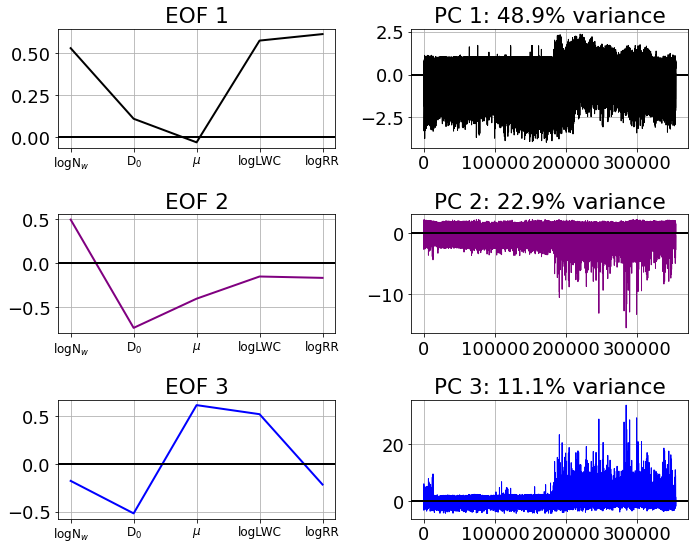

In [109]:
dsd.plot_eofs()

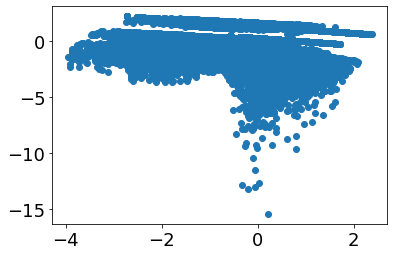

In [110]:
plt.scatter(dsd.get_pc(rank=1),dsd.get_pc(rank=2))

In [111]:
csaprgroups = dfunc.get_groups(dsd.get_pc(rank=1),dsd.get_pc(rank=2),0.8,0.8,0.8,0.8)

In [112]:
gnums = np.zeros_like(np.ravel(d0))
wh1 = csaprgroups['Group1']
wh2 = csaprgroups['Group2']
wh3 = csaprgroups['Group3']
wh4 = csaprgroups['Group4']
wh5 = csaprgroups['Group5']
wh6 = csaprgroups['Group6']


if np.any(wh1)>0:
    gnums[wh1]=1
if np.any(wh2)>0:
    gnums[wh2]=2
if np.any(wh3)>0:
    gnums[wh3]=3
if np.any(wh4)>0:
    gnums[wh4]=4
if np.any(wh5)>0:
    gnums[wh5]=5
if np.any(wh6)>0:
    gnums[wh6]=6







/tmp/ipykernel_6574/856373091.py:1: RuntimeWarning: divide by zero encountered in log10
  plt.scatter(np.ravel(d0),np.log10(np.ravel(nw)),c=gnums,vmin=0,vmax=7,cmap=pcacol ,marker='o')


(-2.0, 15.0)

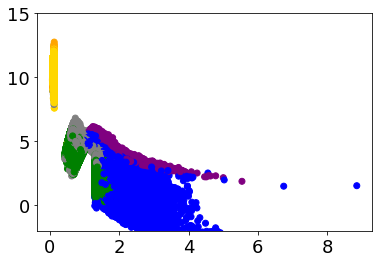

In [113]:
plt.scatter(np.ravel(d0),np.log10(np.ravel(nw)),c=gnums,vmin=0,vmax=7,cmap=pcacol ,marker='o')
plt.ylim(-2,15)

In [114]:
mc3edata= pickle.load(open("/precipitation/bdolan/mc3e_raindata.p",'rb'),encoding='latin1')



In [115]:
mc3edata.keys()

dict_keys(['nww', 'd00', 'ntt', 'dmm', 'kdpratss', 'muu', 'rrr', 'dmaxx', 'dminn', 'sigdd', 'lwcc', 'dbzcc', 'zdrcc', 'kdpcc', 'dbzxx', 'zdrxx', 'kdpxx', 'dbzss', 'zdrss', 'kdpss', 'name', 'yyy', 'doyy', 'hhh', 'mmm', 'sigm', 'dm_s', 'exper', 'lnw', 'lnt', 'lrr', 'llwc', 'datetime'])

In [116]:
import numpy as np

In [117]:
np.unique(mc3edata['name'])

array([b'sn25', b'sn35', b'sn36', b'sn37', b'sn38'], dtype=object)

In [118]:
np.shape(mc3edata['rrr'])
np.shape(orr[whm3])

(828,)

In [119]:
np.shape(wh25)

NameError: name 'wh25' is not defined

In [120]:
wh25 = np.squeeze(np.where(mc3edata['name']==b'sn25'))
wh35 = np.squeeze(np.where(mc3edata['name']==b'sn35'))
wh36 = np.squeeze(np.where(mc3edata['name']==b'sn36'))
wh37 = np.squeeze(np.where(mc3edata['name']==b'sn37'))
wh38 = np.squeeze(np.where(mc3edata['name']==b'sn38'))





print(wh25)

[   0    1    2 ... 1285 1286 1287]


In [121]:
print(np.array(mc3edata['datetime'])[wh25])
print(mc3edata['rrr'][wh25])

[datetime.datetime(2011, 4, 24, 10, 4)
 datetime.datetime(2011, 4, 24, 10, 5)
 datetime.datetime(2011, 4, 24, 10, 6) ...
 datetime.datetime(2011, 5, 25, 20, 37)
 datetime.datetime(2011, 5, 25, 20, 38)
 datetime.datetime(2011, 5, 25, 20, 39)]
[5.17  3.627 2.129 ... 1.422 0.616 0.922]


(15114.25, 15114.75)

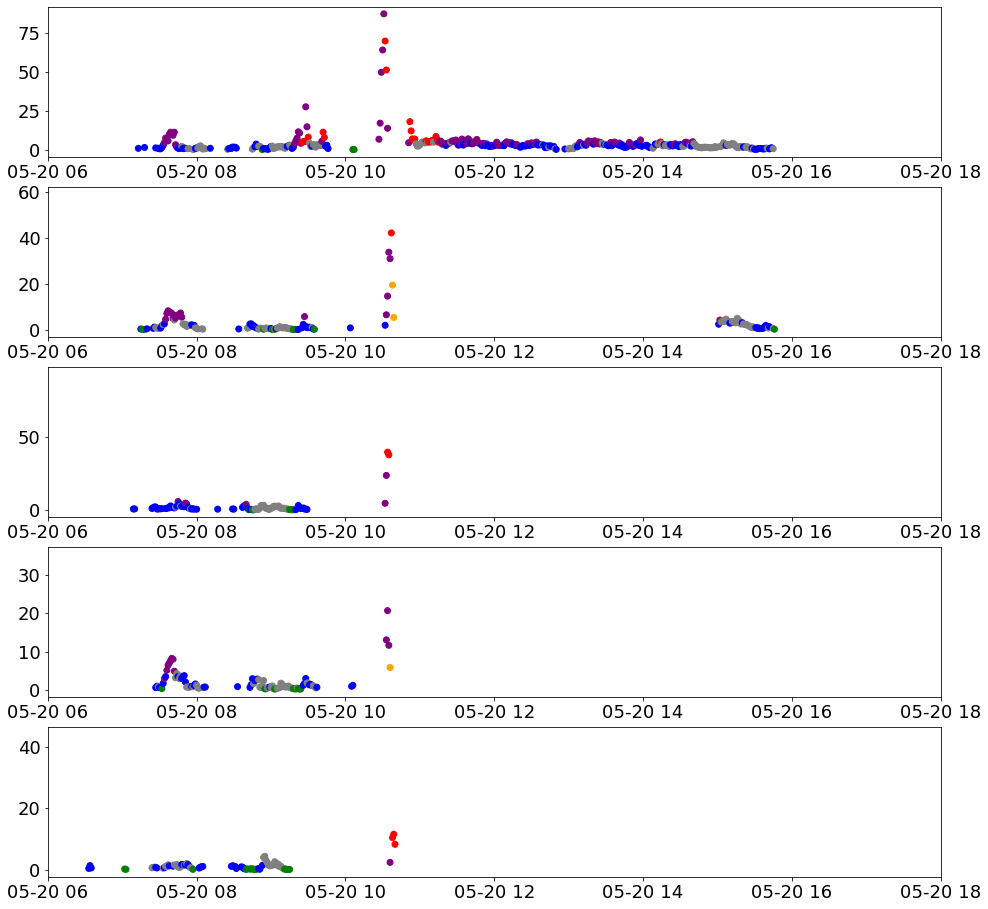

In [122]:
fig, ax =plt.subplots(5,1,figsize=(16,16))
axf = ax.flatten()
axf[0].scatter(np.array(mc3edata['datetime'])[wh25],mc3edata['rrr'][wh25],c=og3[wh25],vmin=0,vmax=7,cmap=pcacol)
axf[0].set_xlim(stime,etime)


axf[1].scatter(np.array(mc3edata['datetime'])[wh35],mc3edata['rrr'][wh35],c=og3[wh35],vmin=0,vmax=7,cmap=pcacol)
axf[1].set_xlim(stime,etime)

axf[2].scatter(np.array(mc3edata['datetime'])[wh36],mc3edata['rrr'][wh36],c=og3[wh36],vmin=0,vmax=7,cmap=pcacol)
axf[2].set_xlim(stime,etime)

axf[3].scatter(np.array(mc3edata['datetime'])[wh37],mc3edata['rrr'][wh37],c=og3[wh37],vmin=0,vmax=7,cmap=pcacol)
axf[3].set_xlim(stime,etime)

axf[4].scatter(np.array(mc3edata['datetime'])[wh38],mc3edata['rrr'][wh38],c=og3[wh38],vmin=0,vmax=7,cmap=pcacol)
axf[4].set_xlim(stime,etime)

In [123]:
np.shape(sn25_trace1_rr)
import matplotlib.dates as mdates
myFmt = mdates.DateFormatter('%H%M')


In [124]:
stime = datetime.datetime(2011,5,20,7)
etime = datetime.datetime(2011,5,20,14)

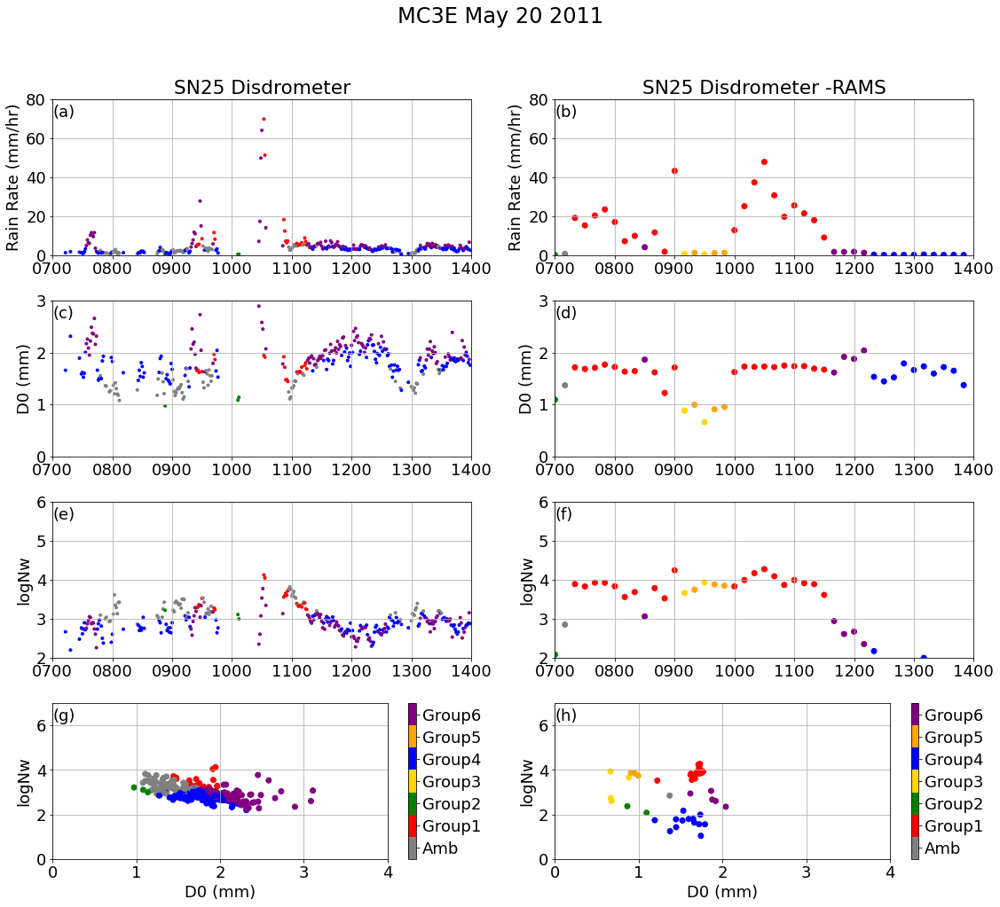

In [125]:
fig, ax =plt.subplots(4,2,figsize=(16,14))
axf = ax.flatten()

whs = np.where(np.logical_and(np.array(mc3edata['datetime'])[wh25]>stime,np.array(mc3edata['datetime'])[wh25]<etime))
axf[0].scatter(np.array(mc3edata['datetime'])[wh25],mc3edata['rrr'][wh25],marker='.',c=og3[wh25],vmin=0,vmax=7,cmap=pcacol)
axf[0].set_xlim(stime,etime)
axf[0].xaxis.set_major_formatter(myFmt)
axf[0].set_ylim(0,80)
axf[0].set_title("SN25 Disdrometer")
axf[0].set_ylabel('Rain Rate (mm/hr)')
axf[2].scatter(np.array(mc3edata['datetime'])[wh25],mc3edata['d00'][wh25],marker='.',c=og3[wh25],vmin=0,vmax=7,cmap=pcacol)
axf[2].set_xlim(stime,etime)
axf[2].xaxis.set_major_formatter(myFmt)

axf[2].set_ylim(0,3.0)
axf[2].set_ylabel('D0 (mm)')
axf[4].scatter(np.array(mc3edata['datetime'])[wh25],np.log10(mc3edata['nww'])[wh25],marker='.',c=og3[wh25],vmin=0,vmax=7,cmap=pcacol)
axf[4].set_xlim(stime,etime)
axf[4].set_ylim(2,6)
axf[4].set_ylabel('logNw')
axf[4].xaxis.set_major_formatter(myFmt)

c=axf[6].scatter(mc3edata['d00'][wh25][whs],np.log10(mc3edata['nww'][wh25][whs]),c=og3[wh25][whs],vmin=0,vmax=7,cmap=pcacol)
axf[6].set_xlim(0,4)
axf[6].set_ylim(0,7)
axf[6].set_xlabel('D0 (mm)')
axf[6].set_ylabel('logNw')
#axf[6].grid()
cb = plt.colorbar(c,ax=axf[6],ticks=[0.5,1.5,2.5,3.5,4.5,5.5,6.5])
cb.ax.set_yticklabels(['Amb','Group1', 'Group2', 'Group3', 'Group4',
                           'Group5', 'Group6'])


axf[1].scatter(dattn,sn25_trace1_rr,c=sn25_trace1_g,vmin=0,vmax=7,cmap=pcacol)
axf[1].set_xlim(stime,etime)
axf[1].set_ylim(0,80)
axf[1].set_ylabel('Rain Rate (mm/hr)')
axf[1].set_title("SN25 Disdrometer -RAMS")

axf[1].xaxis.set_major_formatter(myFmt)



axf[3].scatter(dattn,sn25_trace1_d0,c=sn25_trace1_g,vmin=0,vmax=7,cmap=pcacol)
axf[3].set_xlim(stime,etime)
axf[3].set_ylim(0,3.0)
axf[3].set_ylabel('D0 (mm)')
axf[3].xaxis.set_major_formatter(myFmt)




axf[5].scatter(dattn,sn25_trace1_nww,c=sn25_trace1_g,vmin=0,vmax=7,cmap=pcacol)
axf[5].set_xlim(stime,etime)
axf[5].set_ylim(2,6)
axf[5].set_ylabel('logNw')
axf[5].xaxis.set_major_formatter(myFmt)




c=axf[7].scatter(sn25_trace1_d0,sn25_trace1_nww,c=sn25_trace1_g,vmin=0,vmax=7,cmap=pcacol)
cb = plt.colorbar(c,ax=axf[7],ticks=[0.5,1.5,2.5,3.5,4.5,5.5,6.5])

#axf[7].grid()
cb.ax.set_yticklabels(['Amb','Group1', 'Group2', 'Group3', 'Group4',
                           'Group5', 'Group6'])

axf[7].set_xlim(0,4)
axf[7].set_ylim(0,7)
axf[7].set_xlabel('D0 (mm)')
axf[7].set_ylabel('logNw')


for a in axf:
    a.grid()

plt.suptitle("MC3E May 20 2011",fontsize=24,y=1.02)
plt.tight_layout()
AT.label_subplots(fig,nlabels=8,fontsize=18,yoff=-0.02)

plt.savefig('SN25_dis_RAMS_timeseries.png',dpi=300,bbox_inches='tight')

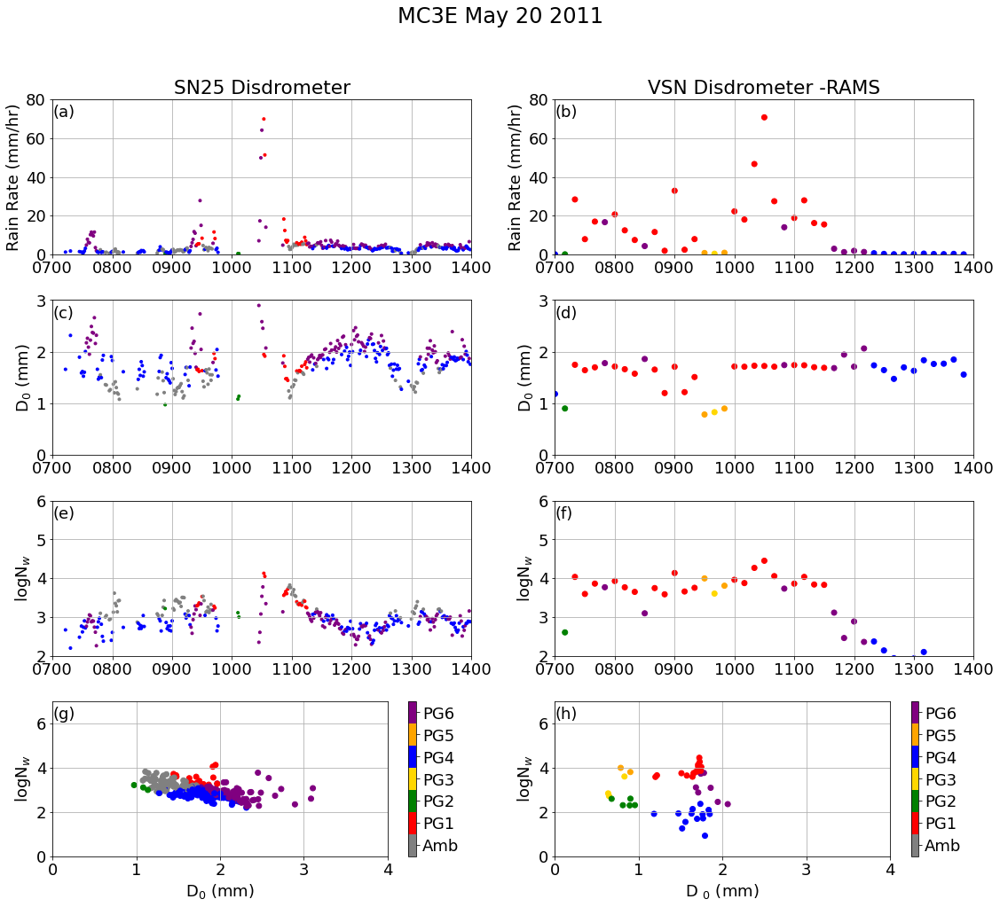

In [126]:
fig, ax =plt.subplots(4,2,figsize=(16,14))
axf = ax.flatten()

whs = np.where(np.logical_and(np.array(mc3edata['datetime'])[wh25]>stime,np.array(mc3edata['datetime'])[wh25]<etime))
axf[0].scatter(np.array(mc3edata['datetime'])[wh25],mc3edata['rrr'][wh25],marker='.',c=og3[wh25],vmin=0,vmax=7,cmap=pcacol)
axf[0].set_xlim(stime,etime)
axf[0].xaxis.set_major_formatter(myFmt)
axf[0].set_ylim(0,80)
axf[0].set_title("SN25 Disdrometer")
axf[0].set_ylabel('Rain Rate (mm/hr)')
axf[2].scatter(np.array(mc3edata['datetime'])[wh25],mc3edata['d00'][wh25],marker='.',c=og3[wh25],vmin=0,vmax=7,cmap=pcacol)
axf[2].set_xlim(stime,etime)
axf[2].xaxis.set_major_formatter(myFmt)

axf[2].set_ylim(0,3.0)
axf[2].set_ylabel('D$_0$ (mm)')
axf[4].scatter(np.array(mc3edata['datetime'])[wh25],np.log10(mc3edata['nww'])[wh25],marker='.',c=og3[wh25],vmin=0,vmax=7,cmap=pcacol)
axf[4].set_xlim(stime,etime)
axf[4].set_ylim(2,6)
axf[4].set_ylabel('logN$_w$')
axf[4].xaxis.set_major_formatter(myFmt)

c=axf[6].scatter(mc3edata['d00'][wh25][whs],np.log10(mc3edata['nww'][wh25][whs]),c=og3[wh25][whs],vmin=0,vmax=7,cmap=pcacol)
axf[6].set_xlim(0,4)
axf[6].set_ylim(0,7)
axf[6].set_xlabel('D$_0$ (mm)')
axf[6].set_ylabel('logN$_w$')
#axf[6].grid()
cb = plt.colorbar(c,ax=axf[6],ticks=[0.5,1.5,2.5,3.5,4.5,5.5,6.5])
cb.ax.set_yticklabels(['Amb','PG1', 'PG2', 'PG3', 'PG4',
                           'PG5', 'PG6'])



axf[1].scatter(dattn,sn35_trace1_rr,c=sn35_trace1_g,vmin=0,vmax=7,cmap=pcacol)
axf[1].set_xlim(stime,etime)
axf[1].set_ylim(0,80)
axf[1].set_ylabel('Rain Rate (mm/hr)')
axf[1].set_title("VSN Disdrometer -RAMS")

axf[1].xaxis.set_major_formatter(myFmt)



axf[3].scatter(dattn,sn35_trace1_d0,c=sn35_trace1_g,vmin=0,vmax=7,cmap=pcacol)
axf[3].set_xlim(stime,etime)
axf[3].set_ylim(0,3.0)
axf[3].set_ylabel('D$_0$ (mm)')
axf[3].xaxis.set_major_formatter(myFmt)




axf[5].scatter(dattn,sn35_trace1_nww,c=sn35_trace1_g,vmin=0,vmax=7,cmap=pcacol)
axf[5].set_xlim(stime,etime)
axf[5].set_ylim(2,6)
axf[5].set_ylabel('logN$_w$')
axf[5].xaxis.set_major_formatter(myFmt)




c=axf[7].scatter(sn35_trace1_d0,sn35_trace1_nww,c=sn35_trace1_g,vmin=0,vmax=7,cmap=pcacol)
cb = plt.colorbar(c,ax=axf[7],ticks=[0.5,1.5,2.5,3.5,4.5,5.5,6.5])

#axf[7].grid()
cb.ax.set_yticklabels(['Amb','PG1', 'PG2', 'PG3', 'PG4',
                           'PG5', 'PG6'])

axf[7].set_xlim(0,4)
axf[7].set_ylim(0,7)
axf[7].set_xlabel('D $_0$ (mm)')
axf[7].set_ylabel('logN$_w$')
for a in axf:
    a.grid()

plt.suptitle("MC3E May 20 2011",fontsize=24,y=1.02)
plt.tight_layout()
AT.label_subplots(fig,nlabels=8,fontsize=18,yoff=-0.02)

plt.savefig(f'{fig_dir}SN25_dis_RAMS_timeseries_obs.png',dpi=300,bbox_inches='tight')

In [127]:
np.shape(mc3edata['datetime'])

(6043,)